# 우리가 뽑은 csv로 test 이미지를 시각화 하여 모델이 어떤 ㄷ이터를 잘 잡지 못하는지 확인이 가능합니다.

Processing Images:   0%|          | 0/120 [00:00<?, ?it/s]

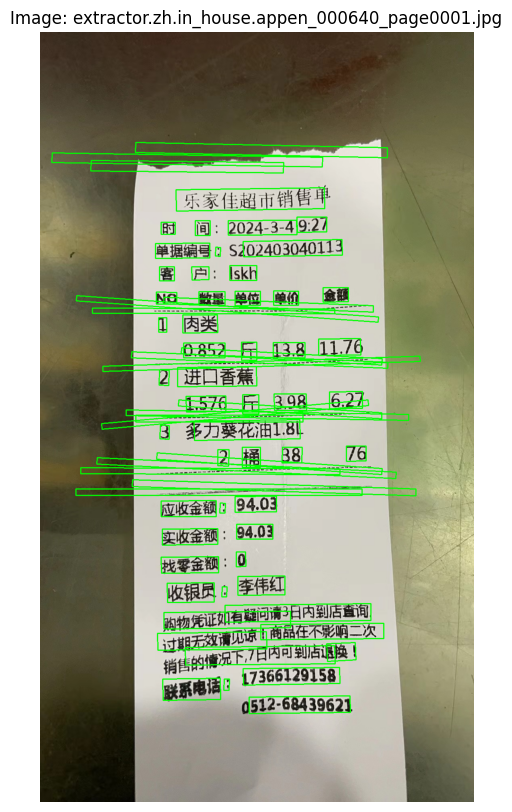

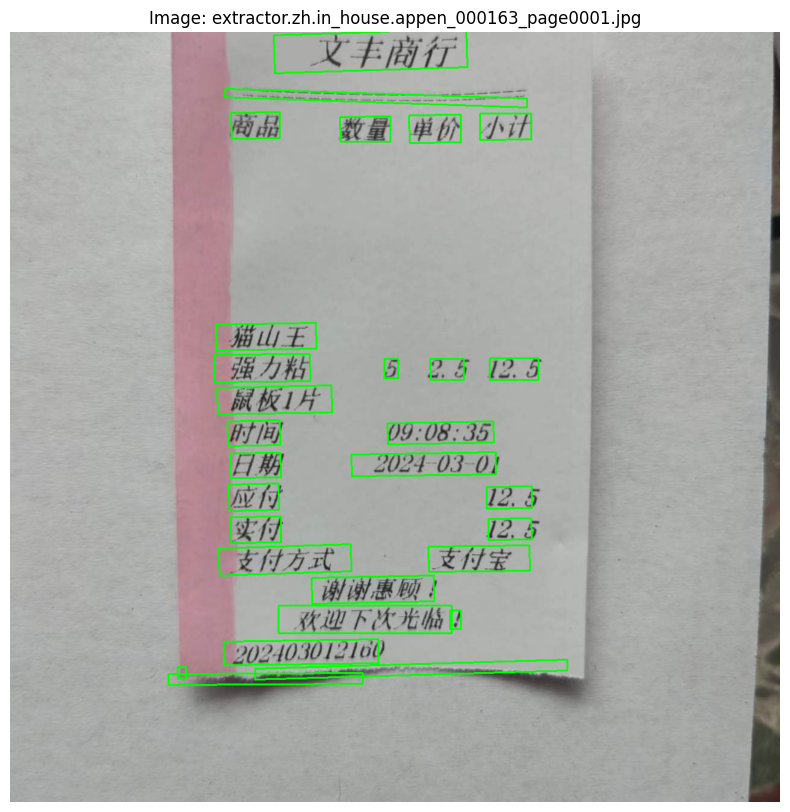

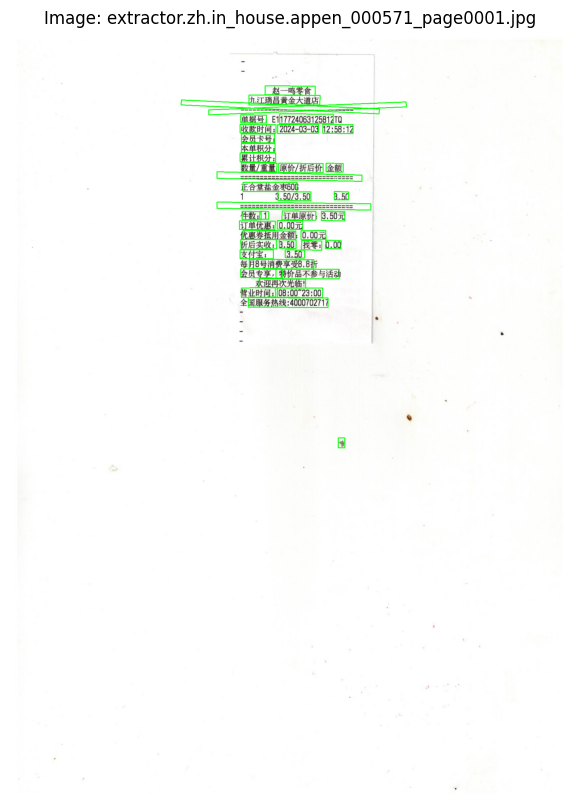

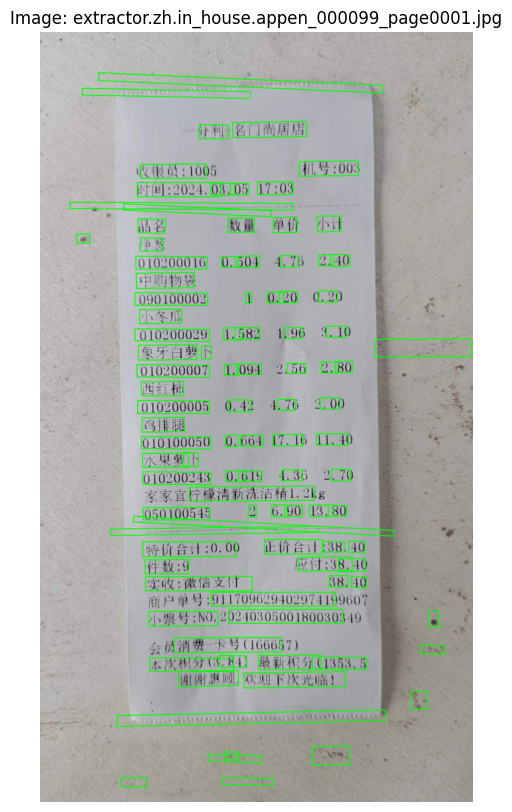

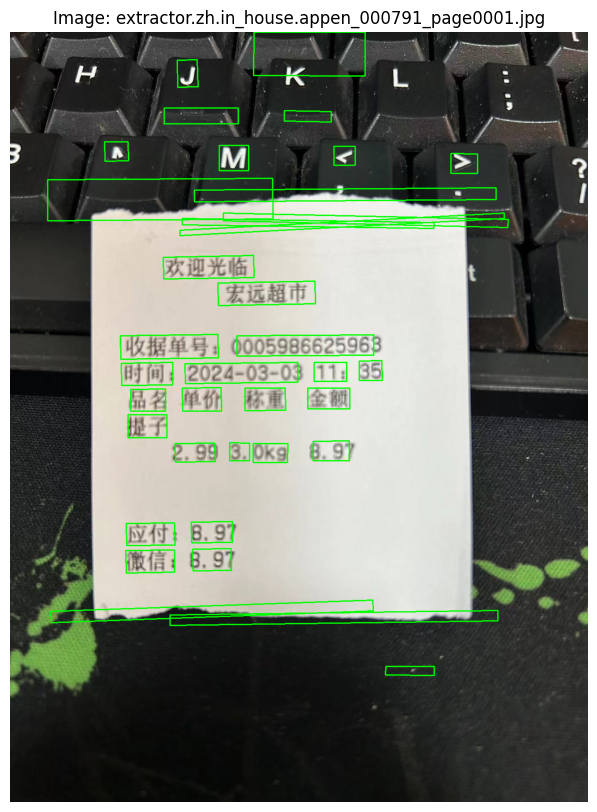

...

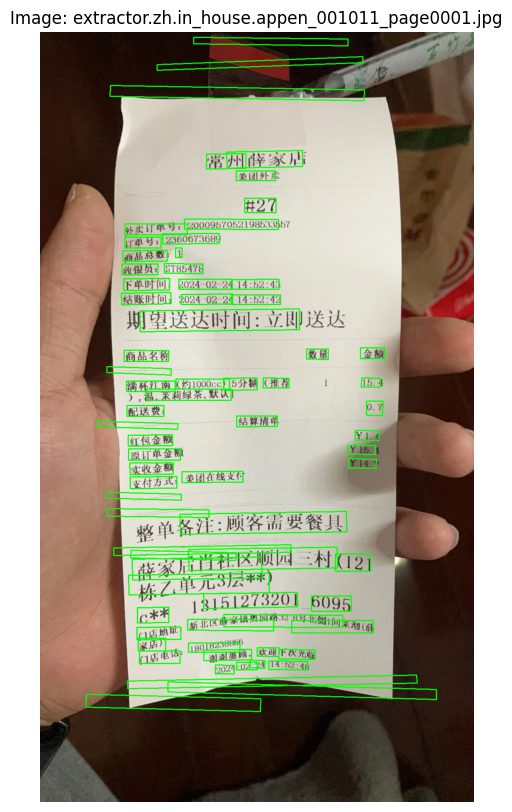

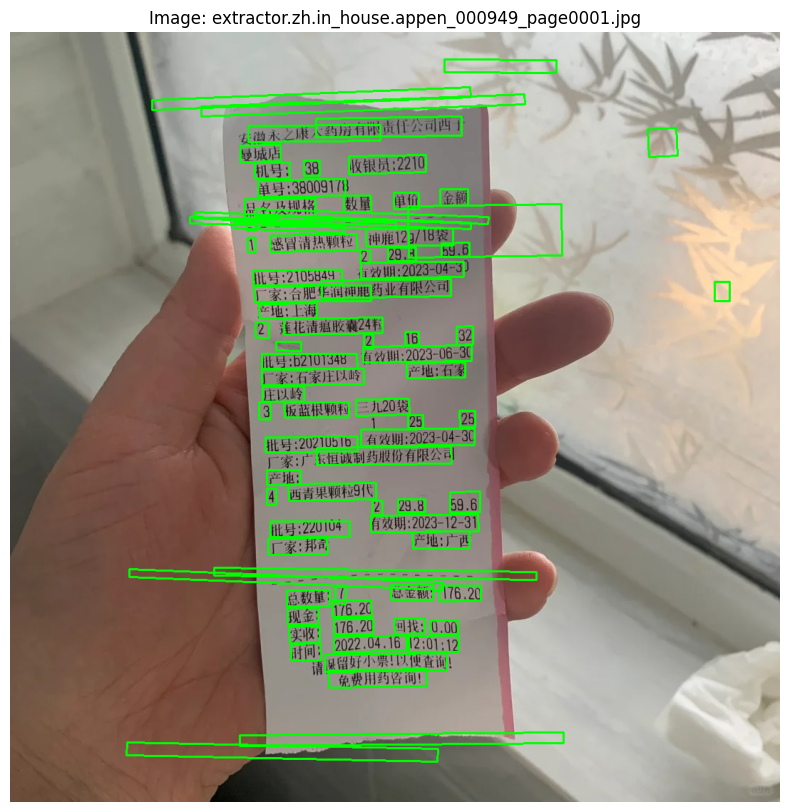

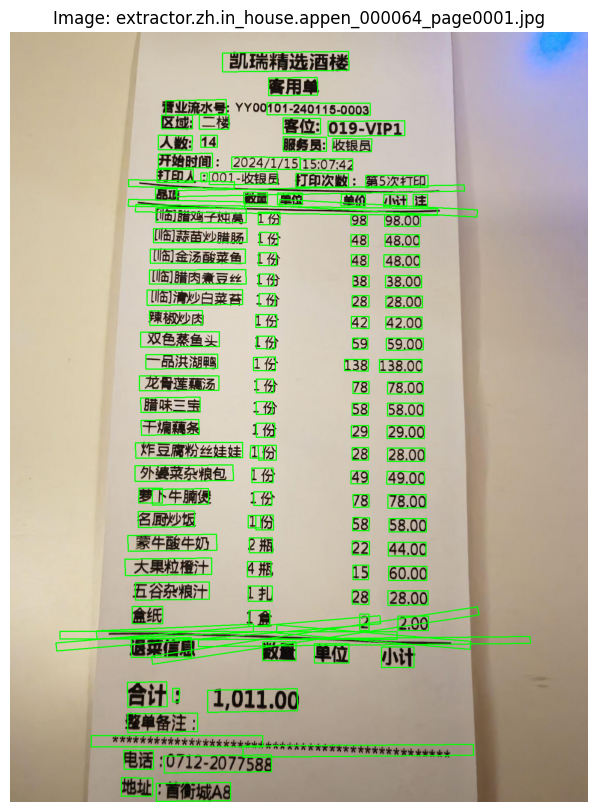

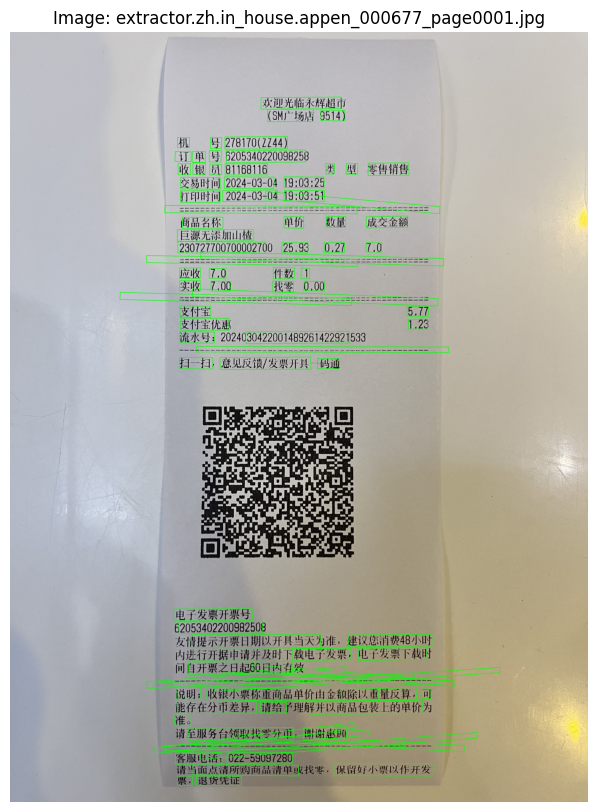

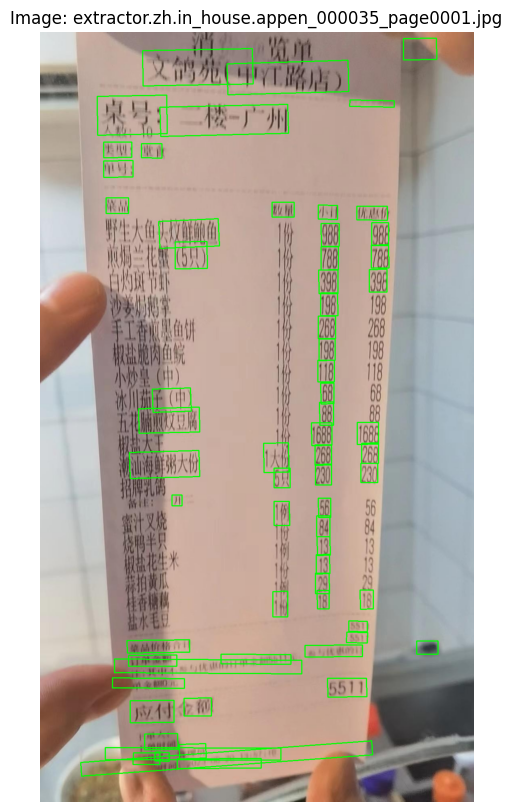

In [ ]:
# 1. 필요한 라이브러리 임포트
import os
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
from glob import glob
from tqdm.auto import tqdm  # 수정된 부분

# 2. 이미지 디렉토리 및 JSON 파일 경로 설정
image_dirs = [
    '/data/ephemeral/home/JSM/level2-cv-datacentric-cv-12/code/data/chinese_receipt/img/test',
    '/data/ephemeral/home/JSM/level2-cv-datacentric-cv-12/code/data/japanese_receipt/img/test',
    '/data/ephemeral/home/JSM/level2-cv-datacentric-cv-12/code/data/thai_receipt/img/test',
    '/data/ephemeral/home/JSM/level2-cv-datacentric-cv-12/code/data/vietnamese_receipt/img/test'
]

json_fpath = '/data/ephemeral/home/JSM/level2-cv-datacentric-cv-12/code/predictions/gray_Norm_Salt_Blur_Rota5_TTA_2024-11-02_00-41-30_training_log_epoch80.csv'
output_dir = '/data/ephemeral/home/JSM/level2-cv-datacentric-cv-12/code/predictions/visualized_images/'

os.makedirs(output_dir, exist_ok=True)

# 3. JSON 파일 로드
try:
    with open(json_fpath, 'r') as f:
        data = json.load(f)
except json.JSONDecodeError:
    print("JSON 파일을 파싱할 수 없습니다. 파일 형식을 확인하세요.")
    data = {}

# 4. 이미지 검색 및 바운딩 박스 시각화 함수 정의
def find_image_path(image_fname, image_dirs):
    for dir_path in image_dirs:
        potential_path = os.path.join(dir_path, image_fname)
        if os.path.exists(potential_path):
            return potential_path
    return None

def draw_bboxes_on_image(image, bboxes, color=(0, 255, 0), thickness=2):
    for bbox in bboxes:
        points = bbox
        pts = np.array(points, np.int32)
        pts = pts.reshape((-1, 1, 2))
        cv2.polylines(image, [pts], isClosed=True, color=color, thickness=thickness)
    return image

# 5. 이미지 시각화 및 저장
images_info = data.get('images', {})

pbar = tqdm(total=len(images_info), desc="Processing Images")  # 수정된 부분

# 시각화할 이미지 수 설정 (예: 첫 5개)
visualize_limit = 400
visualize_count = 0

for image_fname, image_data in images_info.items():
    image_path = find_image_path(image_fname, image_dirs)
    
    if image_path is None:
        print(f"이미지를 찾을 수 없습니다: {image_fname}")
        pbar.update(1)
        continue
    
    image = cv2.imread(image_path)
    if image is None:
        print(f"이미지를 열 수 없습니다: {image_path}")
        pbar.update(1)
        continue
    
    words_info = image_data.get('words', {})
    bboxes = [word_info['points'] for word_info in words_info.values()]
    
    image_with_bboxes = draw_bboxes_on_image(image.copy(), bboxes, color=(0, 255, 0), thickness=2)
    
    output_path = os.path.join(output_dir, image_fname)
    cv2.imwrite(output_path, image_with_bboxes)
    
    if visualize_count < visualize_limit:
        image_rgb = cv2.cvtColor(image_with_bboxes, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10, 10))
        plt.imshow(image_rgb)
        plt.title(f'Image: {image_fname}')
        plt.axis('off')
        plt.show()
        visualize_count += 1
    
    pbar.update(1)

pbar.close()
print(f"모든 이미지를 처리했습니다. 시각화된 이미지는 '{output_dir}'에 저장되었습니다.")

In [1]:
import wandb
run = wandb.init()
artifact = run.use_artifact('yujihwan-yonsei-university/JSM_grayscale/model-checkpoint-epoch-20:v0', type='model')
artifact_dir = artifact.download()

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin


wandb: Downloading large artifact model-checkpoint-epoch-20:v0, 57.71MB. 1 files... 
wandb:   1 of 1 files downloaded.  
Done. 0:0:0.5
